In [1]:
import pandas as pd
import numpy as np
import random

import librosa

import os

import wandb

from tqdm import tqdm

import matplotlib as mpl
import matplotlib.pylab as plt
import matplotlib.patches as mpatches
import seaborn as sns

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
import torch.optim as optim
import torch.nn.functional as F

from scipy import signal

import gc

from src.styles import set_styles, PALETTE
from src.experiment import experiment, continue_experiment, dataloaders_dict, model_dict

import warnings
warnings.filterwarnings("ignore")

SEED=42

In [2]:
# ---- REPRODICIBILITY ------------------------------------------------
np.random.seed(SEED)
random.seed(SEED)


# ---- PANDAS ---------------------------------------------------------
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:,.4f}'.format



set_styles()

In [3]:
def target_status(row):
    num_annot = row.iloc[-6:].sum()
    if (num_annot < 3):
        return 'weak'
    
    row = row.iloc[-6:] / num_annot
    delta = 2. / num_annot
    if (row.iloc[-6:] == 1).any():
        return 'ideal'
    elif (row['other_vote'] >= (0.5 - delta)) & (row['other_vote'] <= (0.5 + delta)) & (row.iloc[-6:-1] == (1. - row['other_vote'])).any():
        return 'proto'
    elif (row['other_vote'] < delta):
        for i in range(2, 7):
            cur = row.iloc[-i]
            if (cur >= (0.5 - delta)) & (cur <= (0.5 + delta)):
                if ((row.iloc[-6:-i] == (1. - cur)).any()) | ((row.iloc[-i+1:-1] == (1. - cur)).any()):
                    return 'edge'
                
    return 'weak'

In [4]:
path = 'data/train.csv'
df = pd.read_csv(path).sort_values(['eeg_id', 'eeg_label_offset_seconds'])
dif = df['eeg_label_offset_seconds'] - df['eeg_label_offset_seconds'].shift(1)
df = df.loc[~((dif > 0) & (dif < 50))].reset_index(drop=True) # use only different events

num_annotators = df.iloc[:, -6:].sum(axis=1)
status = df.apply(lambda row: target_status(row), axis=1)

df.insert(df.shape[1] - 7, 'num_annotators', num_annotators)
df.insert(df.shape[1] - 7, 'status', status)

df_bad_ch = pd.read_csv('data/num_bad_channels.csv')
df.insert(df.shape[1] - 7, 'num_bad_channels', df_bad_ch['num_bad_channels'])

df

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,num_annotators,status,num_bad_channels,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,568657,0,0.0000,789577333,0,0.0000,1825637311,20654,12,weak,0,Other,0,0,3,0,2,7
1,582999,0,0.0000,1552638400,0,0.0000,1722186807,20230,14,weak,0,LPD,0,12,0,1,0,1
2,642382,0,0.0000,14960202,12,"1,008.0000",3254468733,5955,1,weak,1,Other,0,0,0,0,0,1
3,751790,0,0.0000,618728447,4,908.0000,2898467035,38549,1,weak,0,GPD,0,0,1,0,0,0
4,778705,0,0.0000,52296320,0,0.0000,3255875127,40955,2,weak,2,Other,0,0,0,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17084,4293354003,0,0.0000,1188113564,0,0.0000,447244163,16610,2,weak,0,GRDA,0,0,0,0,1,1
17085,4293843368,0,0.0000,1549502620,0,0.0000,1618953053,15065,2,weak,0,GRDA,0,0,0,0,1,1
17086,4294455489,0,0.0000,2105480289,0,0.0000,469526364,56,1,weak,0,Other,0,0,0,0,0,1
17087,4294858825,0,0.0000,657299228,0,0.0000,561576493,4312,15,weak,0,Other,0,0,0,0,1,14


In [5]:
df_ideal = df.loc[df['status'] == 'ideal'] \
    .sort_values(['expert_consensus', 'num_annotators'], ascending=False) \
    .groupby('expert_consensus') \
    .head(3)
df_ideal

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,num_annotators,status,num_bad_channels,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
8399,2088807520,0,0.0000,198643605,0,0.0000,2493314214,40881,16,ideal,2,Seizure,16,0,0,0,0,0
12152,3030710864,0,0.0000,388803499,0,0.0000,2569163393,14965,16,ideal,0,Seizure,16,0,0,0,0,0
932,241433122,0,0.0000,2058601455,0,0.0000,663904781,4863,15,ideal,0,Seizure,15,0,0,0,0,0
2622,658623458,0,0.0000,746484395,0,0.0000,1066857183,63946,23,ideal,2,Other,0,0,0,0,0,23
2366,590374806,0,0.0000,766843679,0,0.0000,2332265795,36490,22,ideal,8,Other,0,0,0,0,0,22
3266,811958440,0,0.0000,1863972381,0,0.0000,2545608526,9223,21,ideal,2,Other,0,0,0,0,0,21
10897,2713014975,0,0.0000,780890284,0,0.0000,3734439265,31386,10,ideal,0,LRDA,0,0,0,10,0,0
3358,839459106,0,0.0000,995785734,2,534.0000,1826634126,37979,5,ideal,0,LRDA,0,0,0,5,0,0
31,7585449,0,0.0000,1966397930,0,0.0000,2823473510,7356,3,ideal,0,LRDA,0,0,0,3,0,0
5281,1317431280,0,0.0000,1060959235,0,0.0000,2577963118,1218,18,ideal,2,LPD,0,18,0,0,0,0


In [6]:
SR = 200
LEN_SEC = 50
DPI=100

def display_eegs(data, label, offset=0):

    df = data.loc[int(offset*SR): int((offset+LEN_SEC)*SR), :]

    fig, ax = plt.subplots(1,1, figsize=(16, 6), dpi=100)

    # display all channels
    for i, col in enumerate(df.columns):
        sns.lineplot(x=np.linspace(0, df.shape[0] // SR, df.shape[0]), y=df[col] / 10 + i, color='black', ax=ax, alpha=0.5, linewidth=1)
        # sns.lineplot(x=np.linspace(0, df.shape[0] // SR, df.shape[0]), y=df[col] / 10 + i, color='black', ax=ax, alpha=0.5, linewidth=1)
        ax.text(-3, i, col)

    # highlight event
    h = df.shape[1] - 1
    w = LEN_SEC
    rect=mpatches.Rectangle((0.4*w,-1),0.2*w,h + 1*2, facecolor=PALETTE[0], alpha=0.3)
    ax.add_patch(rect)

    ax.set_xticks(np.arange(0, 50, 10), np.arange(0, 50, 10))
    ax.grid(axis='x')
        
    ax.set_xlabel('seconds')
    ax.set_ylabel('')
    ax.set_yticklabels([])

    ax.set_title(label, loc='center')
    
    plt.tight_layout()
    plt.show()



def get_diagnosis(dict):
    res = ''
    for k,v in dict.items():
        if v > 0:
            res += '| ' + k[:-5] + ' ' + str(v) + ' |'
    return res

In [19]:
class DoubleBananaMontage:

    def __init__(self, eeg, low_freq=0.5, high_freq=40, order=4, drop_bad_channels=True, verbose=False):
        self.eeg = DoubleBananaMontage.filter_eeg(eeg, order=order, low_freq=low_freq, high_freq=high_freq)
        self.regions = None
        self.verbose = verbose
        self.drop_bad_channels = drop_bad_channels

        self.region_channels = self.__get_region_channels()

    @staticmethod
    def filter_eeg(eeg, order=4, low_freq=0.5, high_freq=40):
        b, a = signal.butter(N=order, Wn=[low_freq, high_freq], btype='band', fs=SR)
        filtered_data = signal.filtfilt(b, a, eeg.values, axis=0)
        return pd.DataFrame(filtered_data, columns=eeg.columns)

    def __get_bad_channels(self):
        stds = self.eeg.std(axis=0)
        std_mean = stds.median()
        bad_channels = [col for i, col in enumerate(self.eeg.columns) if stds[i] > 5*std_mean]
        
        if self.verbose:
            print('Identified bad channels:    ', bad_channels)

        return bad_channels
    

    def __get_region_channels(self):
        temporal_left = ['Fp1','F7','T3','T5','O1']
        temporal_right = ['Fp2','F8','T4','T6','O2']

        parasagittal_left = ['Fp1','F3','C3','P3','O1']
        parasagittal_right = ['Fp2','F4','C4','P4','O2']

        central = ['Fz','Cz','Pz']

        chains = [temporal_left, temporal_right, parasagittal_left, parasagittal_right, central]

        if not self.drop_bad_channels:
            return chains        

        bad_set = self.__get_bad_channels()
        if len(bad_set) == 0:
            return chains
        else:
            new_chains = []
            for ch in chains:
                new_ch = [c for c in ch if c not in bad_set]
                new_chains.append(new_ch)
            return new_chains

   

    def get_regional_average_spectrograms(self, fft_sec=1):
        res = []
        w = int(fft_sec*SR) // 4
        h = int(50*SR / w + 1)
        for channels in self.region_channels:
            spectrogram = []
            for i in range(len(channels) - 1):
                x = self.eeg[channels[i]] - self.eeg[channels[i+1]]

                sp = librosa.stft(x.values, n_fft=int(fft_sec*SR) )
                sp_db = librosa.amplitude_to_db(np.abs(sp))[:sp.shape[0] // 2, :]
                sp_db = (sp_db - sp_db.mean()) / sp_db.std()
                # print(sp_db.min(), sp_db.max(), sp_db.mean())

                spectrogram.append(sp_db)
            spectrogram = np.array(spectrogram).mean(axis=0) if len(spectrogram) > 0 else np.zeros((w, h))
            res.append(spectrogram)
        return res
    

    @staticmethod
    def display_spectrograms(spectrograms, title, w, h):

        _, axes = plt.subplots(nrows=1, ncols=len(spectrograms), figsize=(w,  h), sharey=True) if w < h else \
                  plt.subplots(ncols=1, nrows=len(spectrograms), figsize=(w,  h), sharex=True)
        axes = axes.ravel()

        titles = ['LL', 'LP', 'RP', 'RL', 'C']
        for i, ax in enumerate(axes):
            if spectrograms[i] is not None:
                ax.imshow(spectrograms[i], origin='lower', vmax=2, vmin=-2)
                ax.set_title(titles[i], fontsize=10)
            else:
                ax.set_xticklabels([])
                ax.set_yticklabels([])

        plt.suptitle(title, fontsize=16, fontweight='bold')

        plt.tight_layout()
        plt.show()

2088807520
Identified bad channels:     ['Fp2']


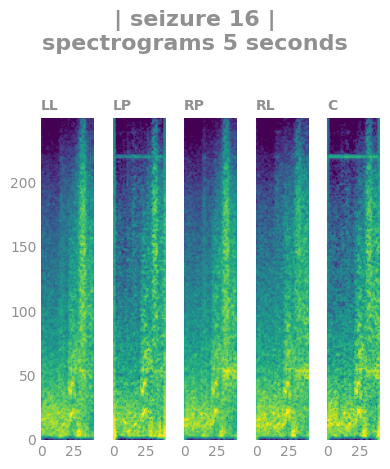

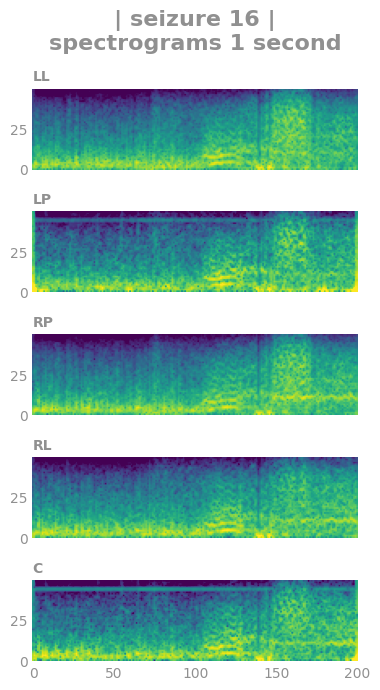

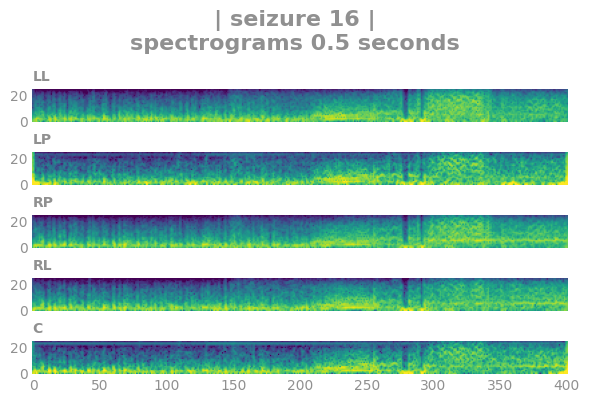

3030710864
Identified bad channels:     []


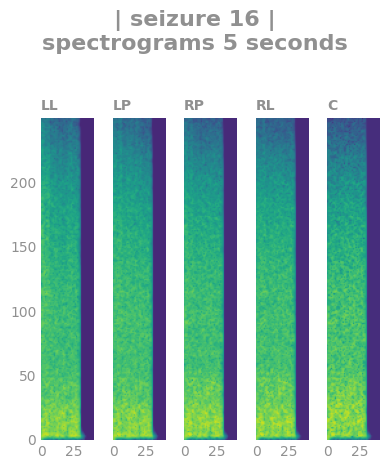

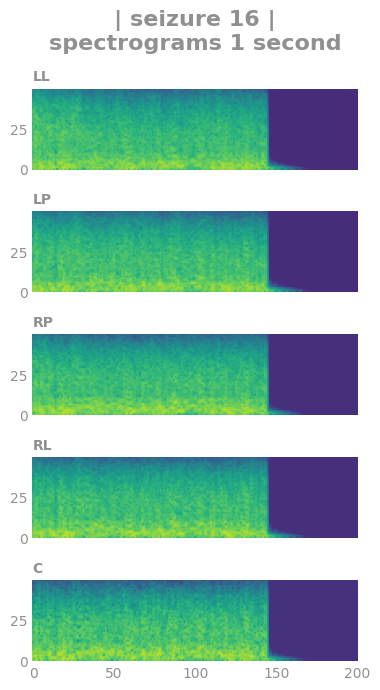

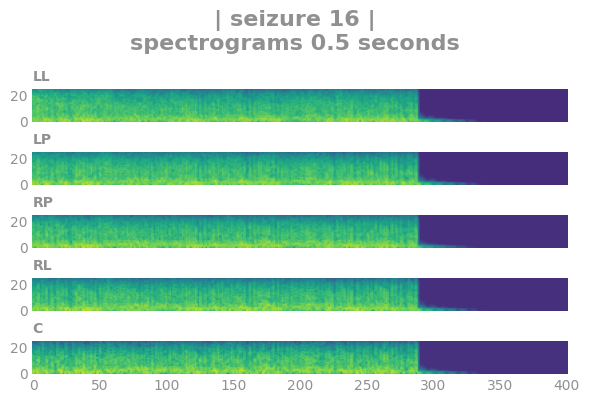

241433122
Identified bad channels:     []


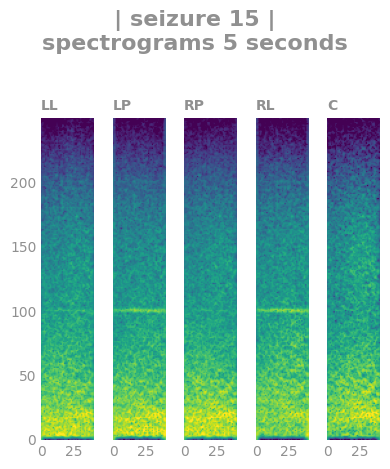

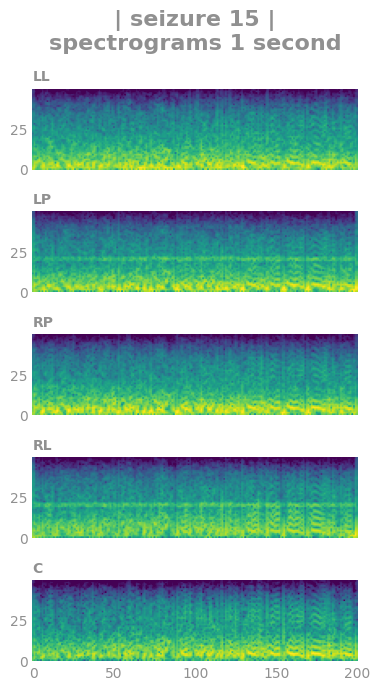

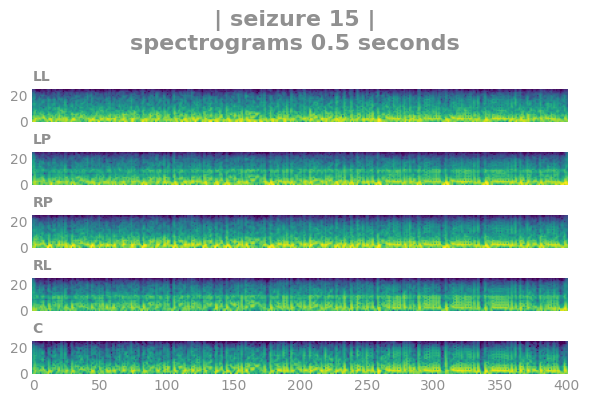

658623458
Identified bad channels:     ['P3', 'T5', 'O1']


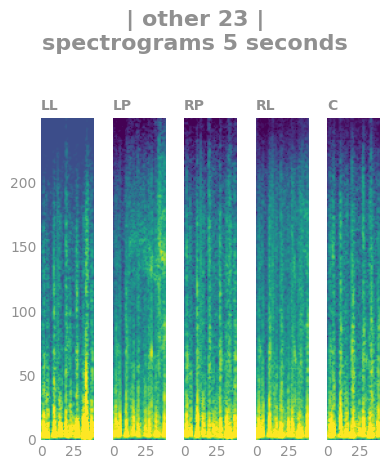

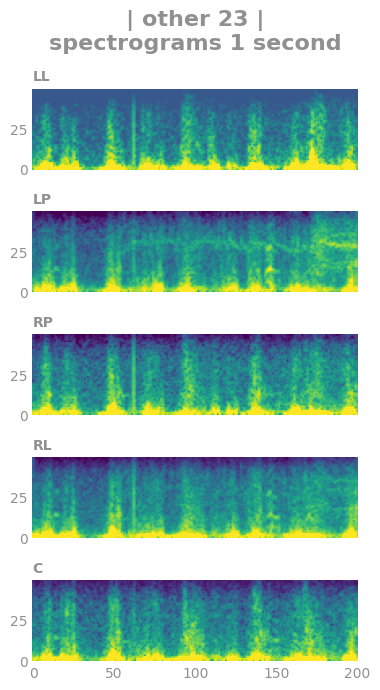

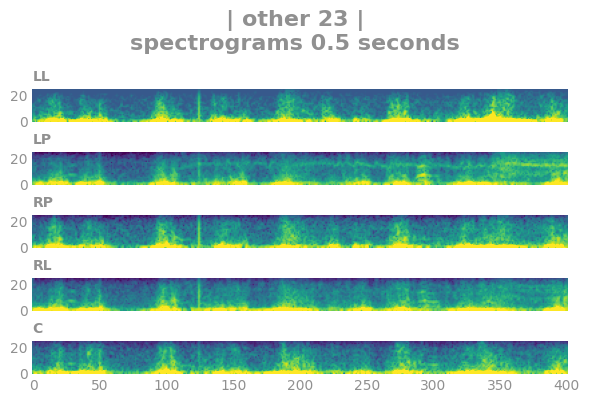

590374806
Identified bad channels:     ['Fp1', 'F3', 'P3', 'F7', 'Fz', 'Pz', 'F4', 'P4']


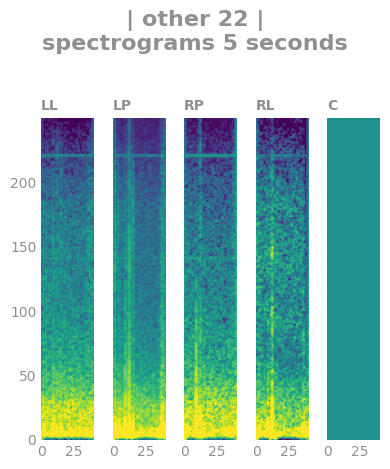

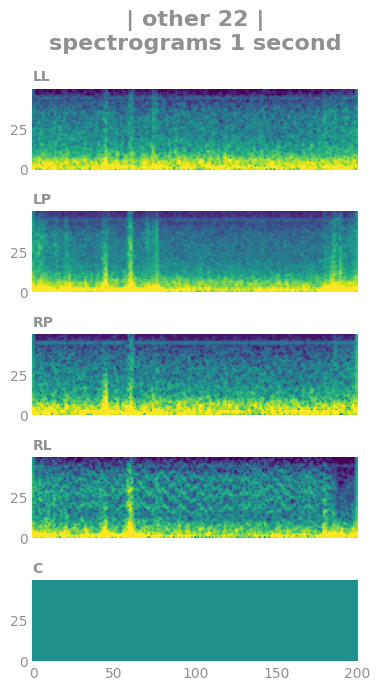

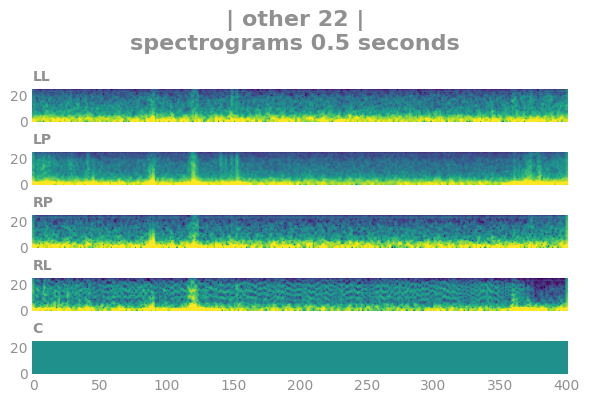

811958440
Identified bad channels:     ['O1', 'F4']


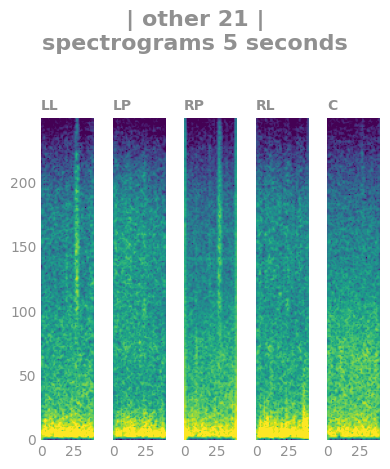

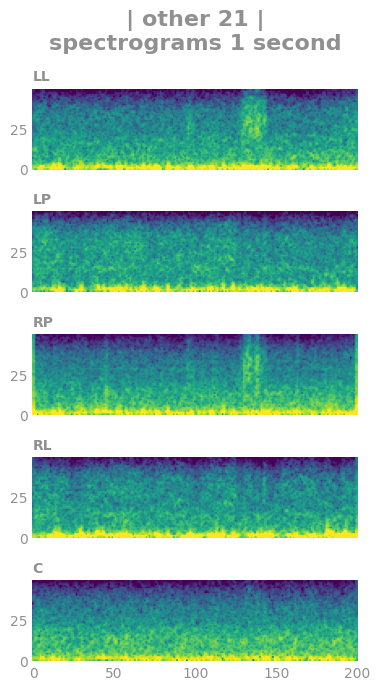

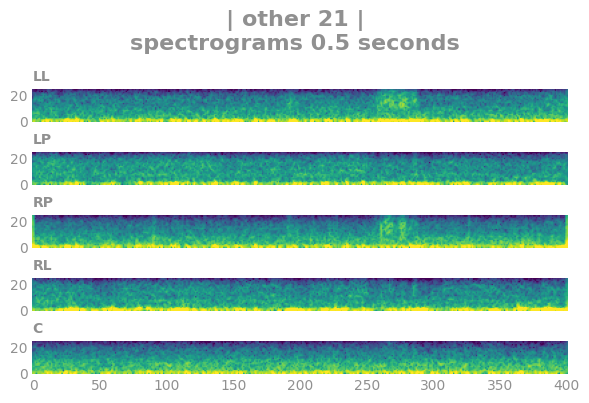

2713014975
Identified bad channels:     []


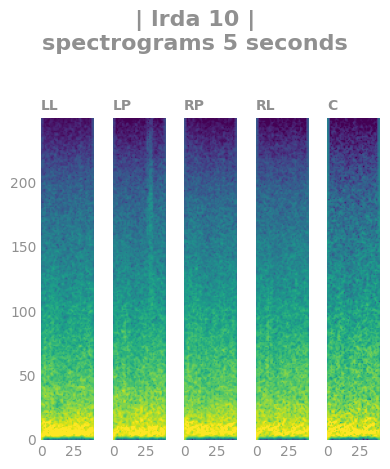

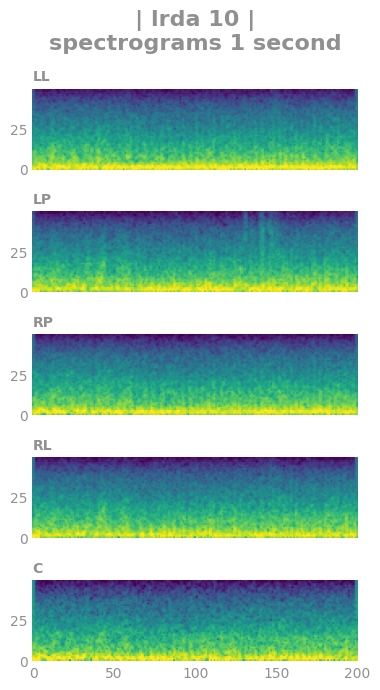

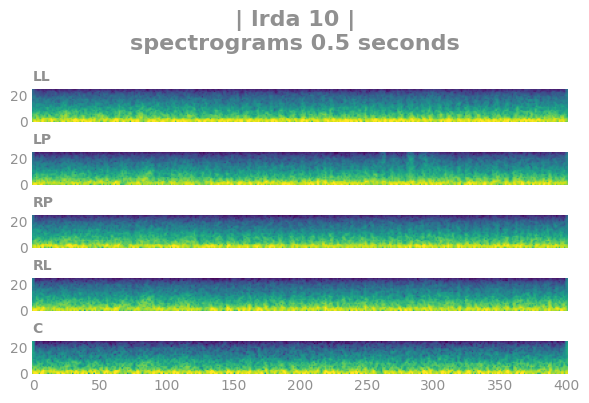

839459106
Identified bad channels:     []


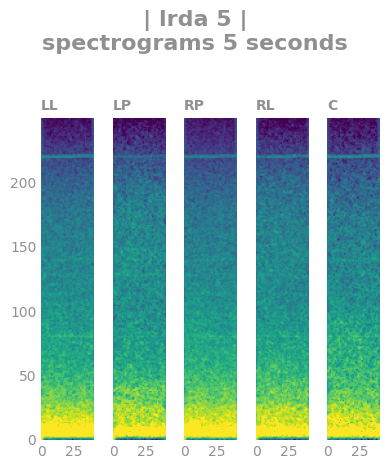

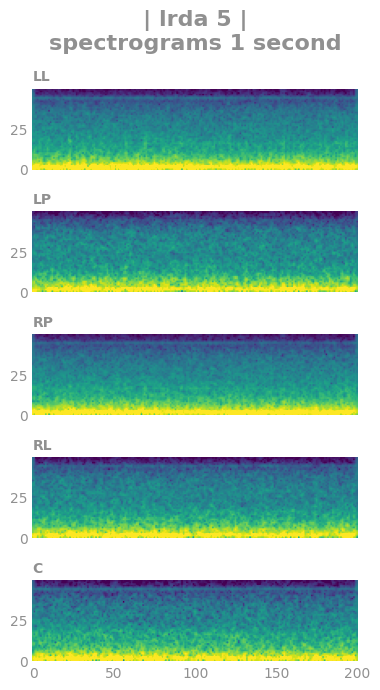

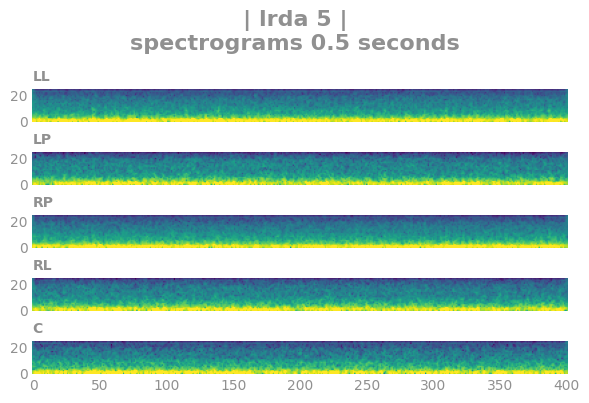

7585449
Identified bad channels:     []


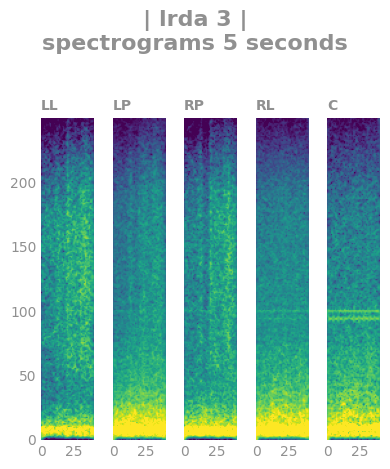

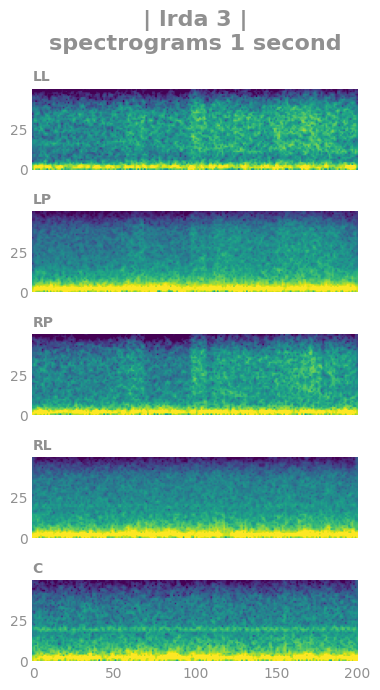

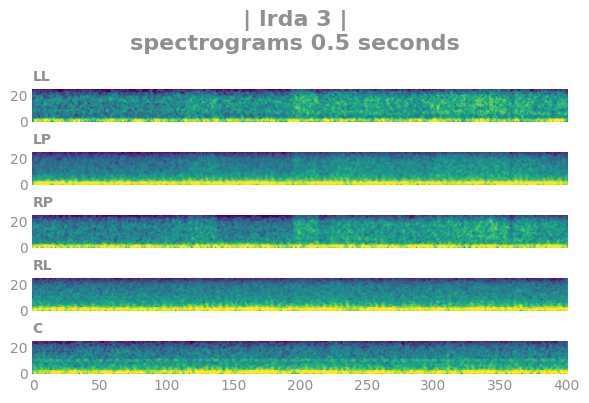

1317431280
Identified bad channels:     []


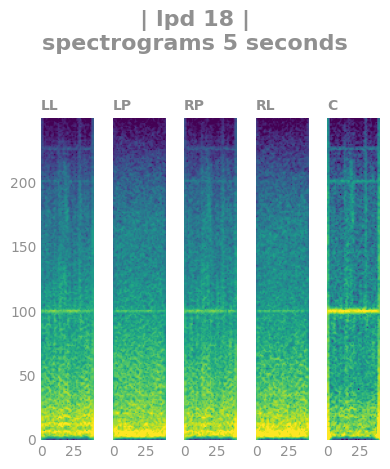

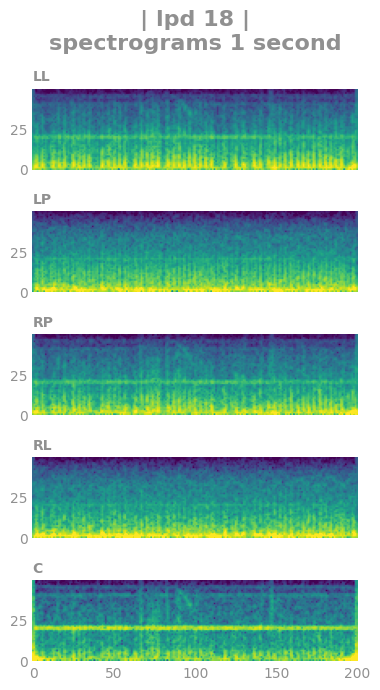

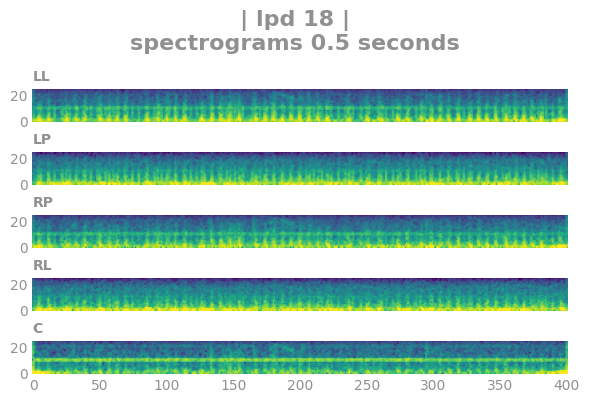

1898956741
Identified bad channels:     []


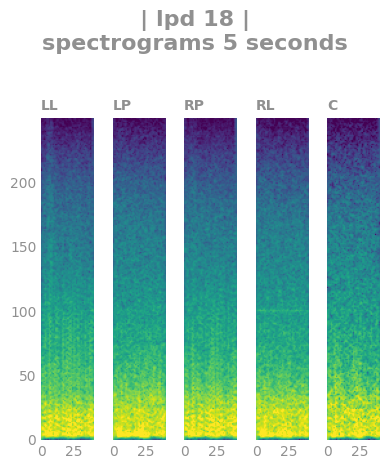

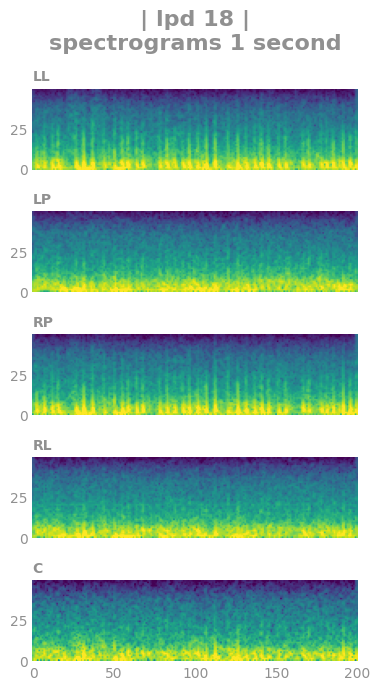

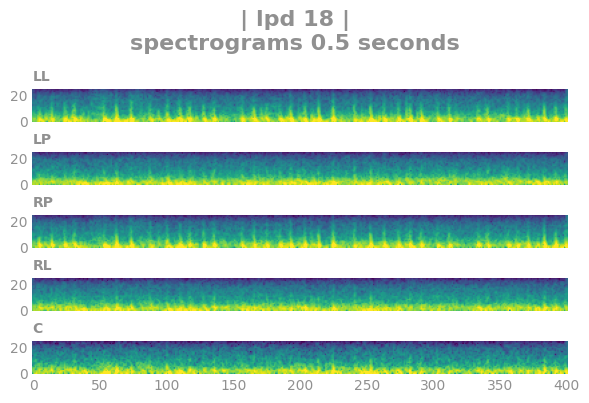

4221431176
Identified bad channels:     []


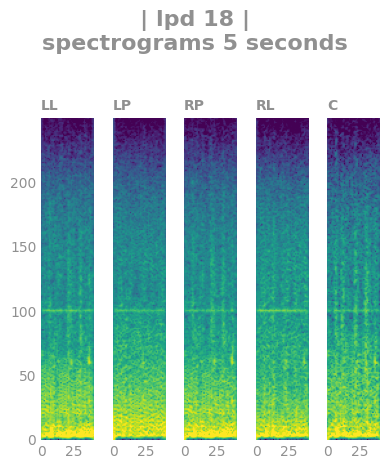

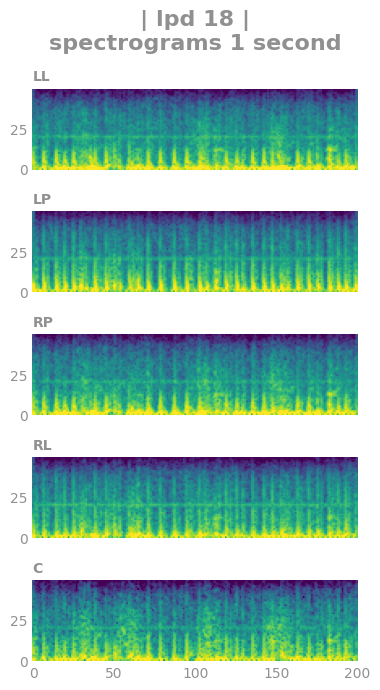

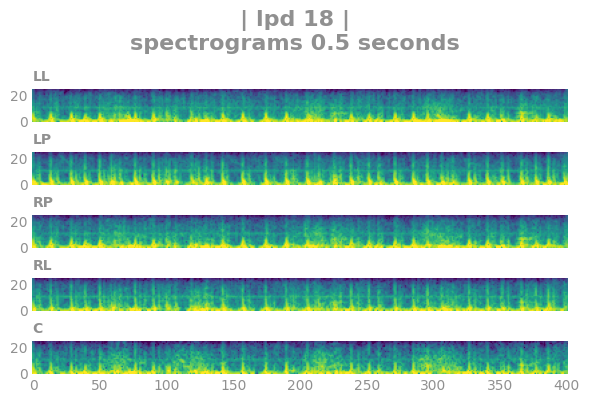

167136080
Identified bad channels:     []


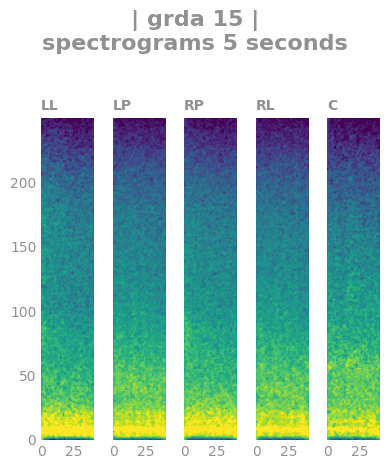

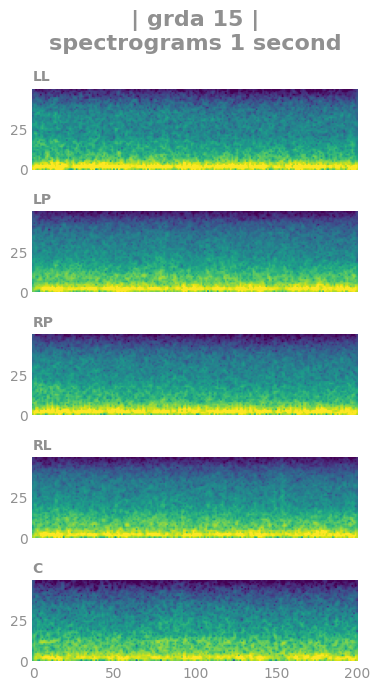

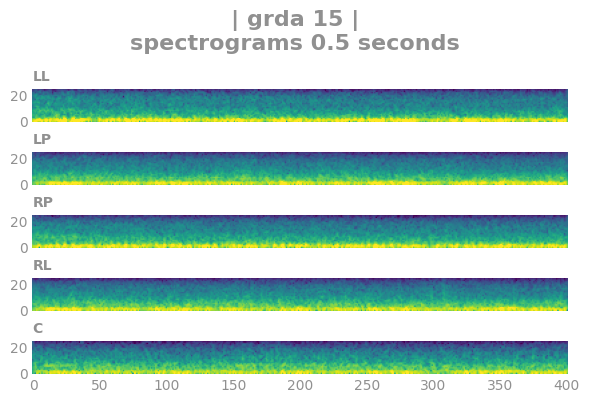

944845698
Identified bad channels:     []


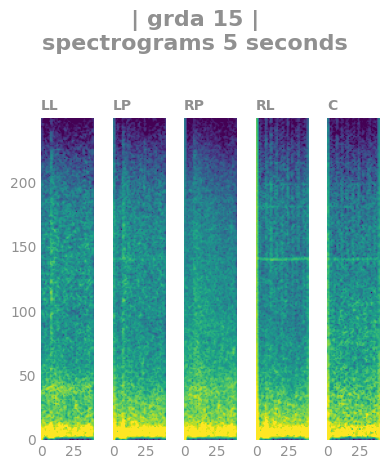

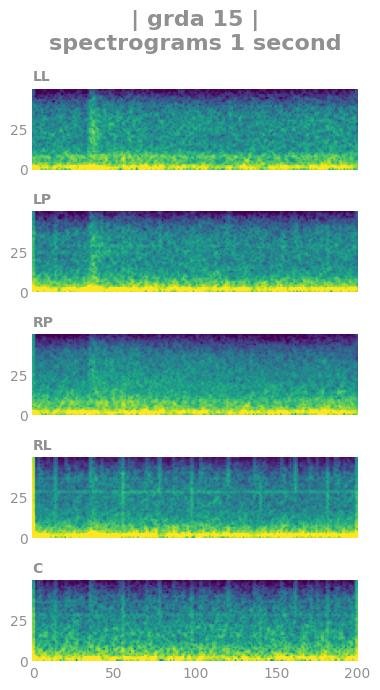

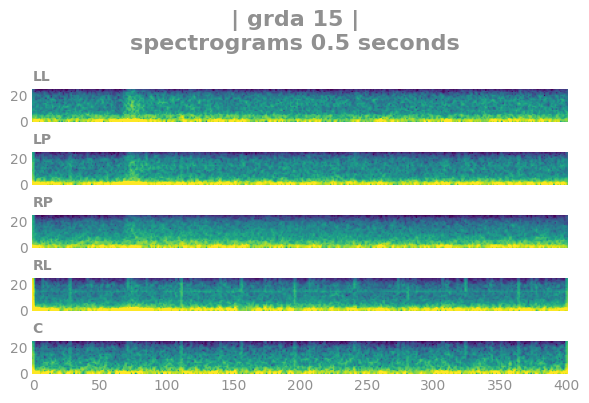

963265939
Identified bad channels:     []


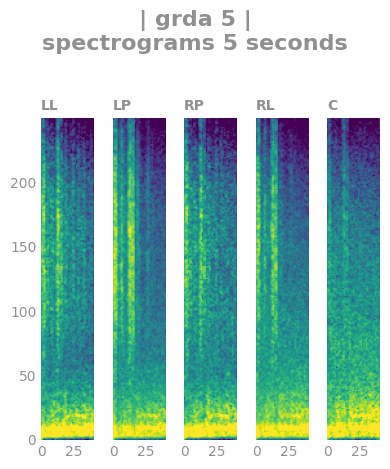

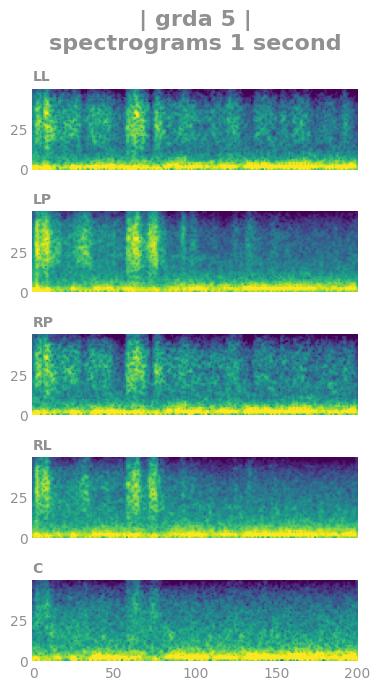

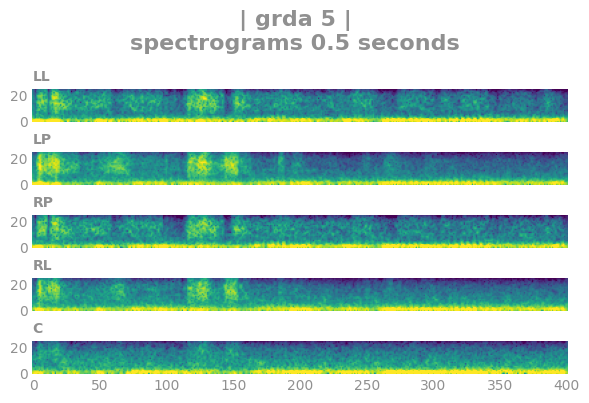

1058173302
Identified bad channels:     []


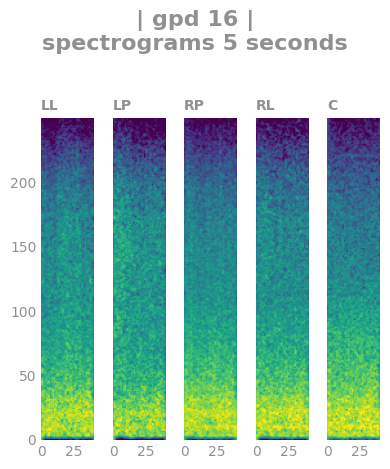

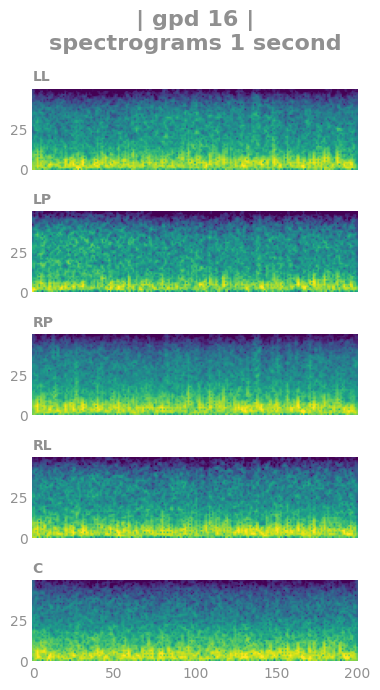

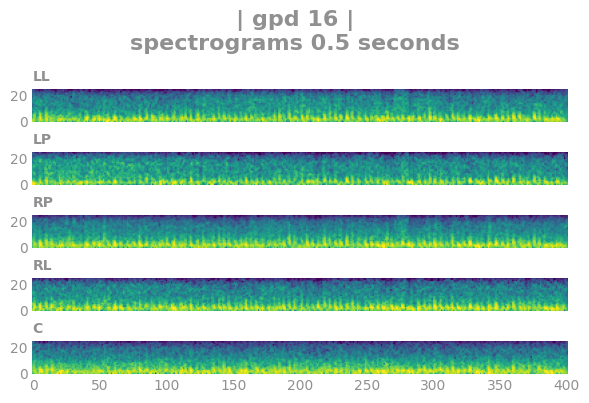

1300795281
Identified bad channels:     []


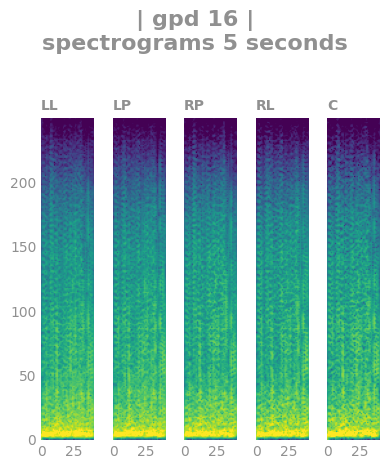

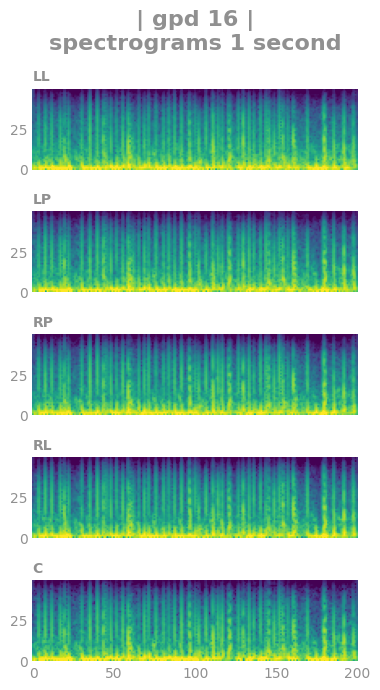

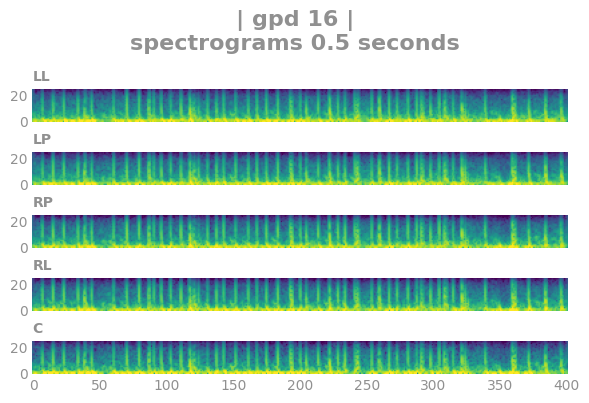

1463717064
Identified bad channels:     []


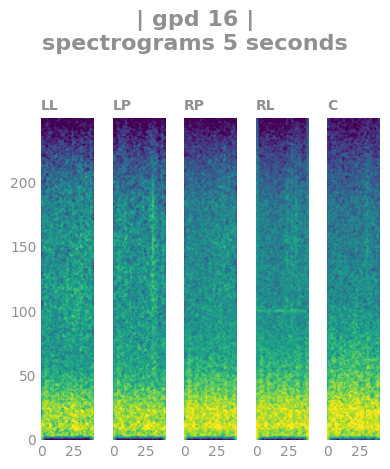

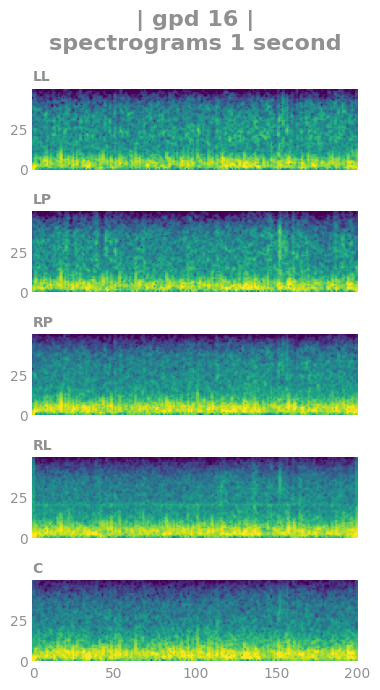

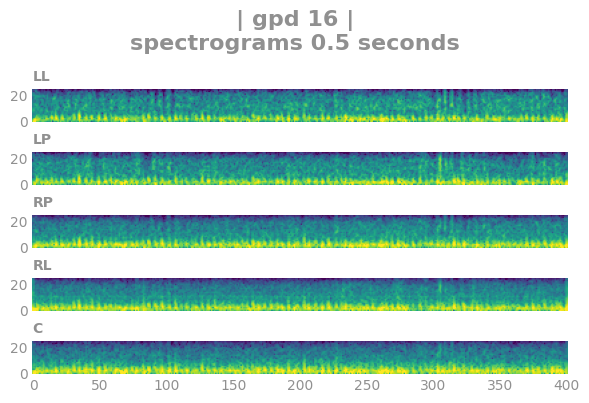

In [30]:
def filter_eeg(eeg):
    b, a = signal.butter(N=4, Wn=[0.5, 40], btype='band', fs=SR)
    filtered_data = signal.filtfilt(b, a, eeg.values, axis=0)
    return pd.DataFrame(filtered_data, columns=eeg.columns)

path_eeg = 'data/train_eegs/'
path_spectrogram = 'data/train_spectrograms/'
SPECTROGRAMS = ['LL','LP','RP','RL']
SP_LEN = 300
SP_NUM_FREQ = 100
SPECTROGRAM_COLS = [
['LL_0.59', 'LL_0.78', 'LL_0.98', 'LL_1.17', 'LL_1.37', 'LL_1.56', 'LL_1.76', 'LL_1.95', 'LL_2.15', 'LL_2.34', 'LL_2.54', 'LL_2.73', 'LL_2.93', 'LL_3.13', 'LL_3.32', 'LL_3.52', 'LL_3.71', 'LL_3.91', 'LL_4.1', 'LL_4.3', 'LL_4.49', 'LL_4.69', 'LL_4.88', 'LL_5.08', 'LL_5.27', 'LL_5.47', 'LL_5.66', 'LL_5.86', 'LL_6.05', 'LL_6.25', 'LL_6.45', 'LL_6.64', 'LL_6.84', 'LL_7.03', 'LL_7.23', 'LL_7.42', 'LL_7.62', 'LL_7.81', 'LL_8.01', 'LL_8.2', 'LL_8.4', 'LL_8.59', 'LL_8.79', 'LL_8.98', 'LL_9.18', 'LL_9.38', 'LL_9.57', 'LL_9.77', 'LL_9.96', 'LL_10.16', 'LL_10.35', 'LL_10.55', 'LL_10.74', 'LL_10.94', 'LL_11.13', 'LL_11.33', 'LL_11.52', 'LL_11.72', 'LL_11.91', 'LL_12.11', 'LL_12.3', 'LL_12.5', 'LL_12.7', 'LL_12.89', 'LL_13.09', 'LL_13.28', 'LL_13.48', 'LL_13.67', 'LL_13.87', 'LL_14.06', 'LL_14.26', 'LL_14.45', 'LL_14.65', 'LL_14.84', 'LL_15.04', 'LL_15.23', 'LL_15.43', 'LL_15.63', 'LL_15.82', 'LL_16.02', 'LL_16.21', 'LL_16.41', 'LL_16.6', 'LL_16.8', 'LL_16.99', 'LL_17.19', 'LL_17.38', 'LL_17.58', 'LL_17.77', 'LL_17.97', 'LL_18.16', 'LL_18.36', 'LL_18.55', 'LL_18.75', 'LL_18.95', 'LL_19.14', 'LL_19.34', 'LL_19.53', 'LL_19.73', 'LL_19.92'],
['LP_0.59', 'LP_0.78', 'LP_0.98', 'LP_1.17', 'LP_1.37', 'LP_1.56', 'LP_1.76', 'LP_1.95', 'LP_2.15', 'LP_2.34', 'LP_2.54', 'LP_2.73', 'LP_2.93', 'LP_3.13', 'LP_3.32', 'LP_3.52', 'LP_3.71', 'LP_3.91', 'LP_4.1', 'LP_4.3', 'LP_4.49', 'LP_4.69', 'LP_4.88', 'LP_5.08', 'LP_5.27', 'LP_5.47', 'LP_5.66', 'LP_5.86', 'LP_6.05', 'LP_6.25', 'LP_6.45', 'LP_6.64', 'LP_6.84', 'LP_7.03', 'LP_7.23', 'LP_7.42', 'LP_7.62', 'LP_7.81', 'LP_8.01', 'LP_8.2', 'LP_8.4', 'LP_8.59', 'LP_8.79', 'LP_8.98', 'LP_9.18', 'LP_9.38', 'LP_9.57', 'LP_9.77', 'LP_9.96', 'LP_10.16', 'LP_10.35', 'LP_10.55', 'LP_10.74', 'LP_10.94', 'LP_11.13', 'LP_11.33', 'LP_11.52', 'LP_11.72', 'LP_11.91', 'LP_12.11', 'LP_12.3', 'LP_12.5', 'LP_12.7', 'LP_12.89', 'LP_13.09', 'LP_13.28', 'LP_13.48', 'LP_13.67', 'LP_13.87', 'LP_14.06', 'LP_14.26', 'LP_14.45', 'LP_14.65', 'LP_14.84', 'LP_15.04', 'LP_15.23', 'LP_15.43', 'LP_15.63', 'LP_15.82', 'LP_16.02', 'LP_16.21', 'LP_16.41', 'LP_16.6', 'LP_16.8', 'LP_16.99', 'LP_17.19', 'LP_17.38', 'LP_17.58', 'LP_17.77', 'LP_17.97', 'LP_18.16', 'LP_18.36', 'LP_18.55', 'LP_18.75', 'LP_18.95', 'LP_19.14', 'LP_19.34', 'LP_19.53', 'LP_19.73', 'LP_19.92'],
['RP_0.59', 'RP_0.78', 'RP_0.98', 'RP_1.17', 'RP_1.37', 'RP_1.56', 'RP_1.76', 'RP_1.95', 'RP_2.15', 'RP_2.34', 'RP_2.54', 'RP_2.73', 'RP_2.93', 'RP_3.13', 'RP_3.32', 'RP_3.52', 'RP_3.71', 'RP_3.91', 'RP_4.1', 'RP_4.3', 'RP_4.49', 'RP_4.69', 'RP_4.88', 'RP_5.08', 'RP_5.27', 'RP_5.47', 'RP_5.66', 'RP_5.86', 'RP_6.05', 'RP_6.25', 'RP_6.45', 'RP_6.64', 'RP_6.84', 'RP_7.03', 'RP_7.23', 'RP_7.42', 'RP_7.62', 'RP_7.81', 'RP_8.01', 'RP_8.2', 'RP_8.4', 'RP_8.59', 'RP_8.79', 'RP_8.98', 'RP_9.18', 'RP_9.38', 'RP_9.57', 'RP_9.77', 'RP_9.96', 'RP_10.16', 'RP_10.35', 'RP_10.55', 'RP_10.74', 'RP_10.94', 'RP_11.13', 'RP_11.33', 'RP_11.52', 'RP_11.72', 'RP_11.91', 'RP_12.11', 'RP_12.3', 'RP_12.5', 'RP_12.7', 'RP_12.89', 'RP_13.09', 'RP_13.28', 'RP_13.48', 'RP_13.67', 'RP_13.87', 'RP_14.06', 'RP_14.26', 'RP_14.45', 'RP_14.65', 'RP_14.84', 'RP_15.04', 'RP_15.23', 'RP_15.43', 'RP_15.63', 'RP_15.82', 'RP_16.02', 'RP_16.21', 'RP_16.41', 'RP_16.6', 'RP_16.8', 'RP_16.99', 'RP_17.19', 'RP_17.38', 'RP_17.58', 'RP_17.77', 'RP_17.97', 'RP_18.16', 'RP_18.36', 'RP_18.55', 'RP_18.75', 'RP_18.95', 'RP_19.14', 'RP_19.34', 'RP_19.53', 'RP_19.73', 'RP_19.92'],
['RL_0.59', 'RL_0.78', 'RL_0.98', 'RL_1.17', 'RL_1.37', 'RL_1.56', 'RL_1.76', 'RL_1.95', 'RL_2.15', 'RL_2.34', 'RL_2.54', 'RL_2.73', 'RL_2.93', 'RL_3.13', 'RL_3.32', 'RL_3.52', 'RL_3.71', 'RL_3.91', 'RL_4.1', 'RL_4.3', 'RL_4.49', 'RL_4.69', 'RL_4.88', 'RL_5.08', 'RL_5.27', 'RL_5.47', 'RL_5.66', 'RL_5.86', 'RL_6.05', 'RL_6.25', 'RL_6.45', 'RL_6.64', 'RL_6.84', 'RL_7.03', 'RL_7.23', 'RL_7.42', 'RL_7.62', 'RL_7.81', 'RL_8.01', 'RL_8.2', 'RL_8.4', 'RL_8.59', 'RL_8.79', 'RL_8.98', 'RL_9.18', 'RL_9.38', 'RL_9.57', 'RL_9.77', 'RL_9.96', 'RL_10.16', 'RL_10.35', 'RL_10.55', 'RL_10.74', 'RL_10.94', 'RL_11.13', 'RL_11.33', 'RL_11.52', 'RL_11.72', 'RL_11.91', 'RL_12.11', 'RL_12.3', 'RL_12.5', 'RL_12.7', 'RL_12.89', 'RL_13.09', 'RL_13.28', 'RL_13.48', 'RL_13.67', 'RL_13.87', 'RL_14.06', 'RL_14.26', 'RL_14.45', 'RL_14.65', 'RL_14.84', 'RL_15.04', 'RL_15.23', 'RL_15.43', 'RL_15.63', 'RL_15.82', 'RL_16.02', 'RL_16.21', 'RL_16.41', 'RL_16.6', 'RL_16.8', 'RL_16.99', 'RL_17.19', 'RL_17.38', 'RL_17.58', 'RL_17.77', 'RL_17.97', 'RL_18.16', 'RL_18.36', 'RL_18.55', 'RL_18.75', 'RL_18.95', 'RL_19.14', 'RL_19.34', 'RL_19.53', 'RL_19.73', 'RL_19.92'],
]
eps = 1e-10

for index, row in df_ideal.iterrows():
    print(row['eeg_id'])
    
    label = get_diagnosis(row.iloc[-6:].to_dict())
    eeg = pd.read_parquet(path_eeg + f'{row["eeg_id"]}.parquet').drop('EKG', axis=1).fillna(0).iloc[:200*50, :]

    db = DoubleBananaMontage(eeg, verbose=True)
    sp = db.get_regional_average_spectrograms(5)
    DoubleBananaMontage.display_spectrograms(sp, f'{label}\nspectrograms 5 seconds', 4, 5)
    sp = db.get_regional_average_spectrograms(1)
    DoubleBananaMontage.display_spectrograms(sp, f'{label}\nspectrograms 1 second', 8, 7)
    sp = db.get_regional_average_spectrograms(0.5)
    DoubleBananaMontage.display_spectrograms(sp, f'{label}\nspectrograms 0.5 seconds', 6, 4)

In [ ]:
from tqdm import tqdm
import polars as pl

path_eeg = 'data/train_eegs/'


bad_eeg_ids =  [1457334423, 1593385762, 120145971, 1511903313, 579740230, 588638365, 
                837428467, 2081405553, 3932380488, 1604371226, 2538961182, 2565199369, 
                1339041688, 812448735, 408047047, 4046938588, 2924540968, 1119914885, 116770645]

for time in [1, 0.5, 5]:
    
    eegs = {}
    # for index in tqdm(range(9)): 
    for index in tqdm(range(df.shape[0])):
        row = df.iloc[index]

        eeg_id = row['eeg_id']

        if eeg_id in bad_eeg_ids:
            continue

        eeg_offset = int(row['eeg_label_offset_seconds'] * SR)

        labels = row.iloc[-6:] / row.iloc[-6:].sum()    

        raw_data = pl.read_parquet(path_eeg + f'{eeg_id}.parquet')
        eeg = raw_data.slice(eeg_offset, LEN_SEC*SR).drop('EKG').to_pandas().fillna(0)

        db = DoubleBananaMontage(eeg)
        sp = db.get_regional_average_spectrograms(time)
        eegs[eeg_id] = sp
        
    np.save(f'data/spectrogram_{time}sec', eegs)

100%|██████████| 17089/17089 [20:54<00:00, 13.63it/s]
